# Instaliranje potrebnih paketa

In [ ]:
!pip install flask flask-cors pyngrok

In [ ]:
!pip install opendatasets

# Ubacivanje dataseta sa Kaggle-a

In [ ]:
import opendatasets as od
import pandas

od.download(
    "https://www.kaggle.com/datasets/kwentar/blur-dataset")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: almabrt
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/kwentar/blur-dataset


100%|██████████| 1.49G/1.49G [00:11<00:00, 136MB/s]


# Import potrebnih biblioteka, učitavanje i priprema slika

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline
import random
import cv2
import os
import tensorflow as tf
from tqdm import tqdm
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.layers import Conv2D, Flatten
from tensorflow.keras.layers import Reshape, Conv2DTranspose
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras import backend as K

good_frames = 'blur-dataset/sharp'
bad_frames = 'blur-dataset/defocused_blurred'

clean_frames = []
for file in tqdm(sorted(os.listdir(good_frames))):
    if any(extension in file for extension in ['.jpg', 'jpeg', '.png']):
        image = tf.keras.preprocessing.image.load_img(good_frames + '/' + file, target_size=(128,128))
        image = tf.keras.preprocessing.image.img_to_array(image).astype('float32') / 255
        clean_frames.append(image)

clean_frames = np.array(clean_frames)

blurry_frames = []
for file in tqdm(sorted(os.listdir(bad_frames))):
    if any(extension in file for extension in ['.jpg', 'jpeg', '.png']):
        image = tf.keras.preprocessing.image.load_img(bad_frames + '/' + file, target_size=(128,128))
        image = tf.keras.preprocessing.image.img_to_array(image).astype('float32') / 255
        blurry_frames.append(image)

blurry_frames = np.array(blurry_frames)

seed = 21
random.seed = seed
np.random.seed = seed



100%|██████████| 350/350 [00:05<00:00, 63.63it/s]


In [ ]:
x = clean_frames;
y = blurry_frames;
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Provjera podataka

In [ ]:
print(x_train[0].shape)
print(y_train[0].shape)

(128, 128, 3)
(128, 128, 3)


# Vizualizacija jednog primjerka
lijevo: oštra slika

desno: zamućena slika

66


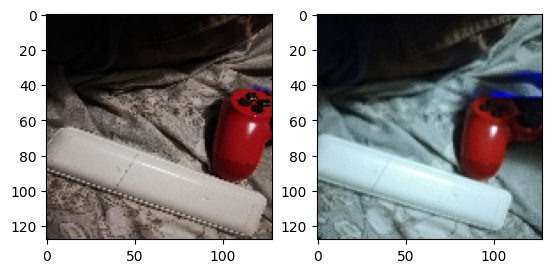

In [ ]:
r = random.randint(0, len(clean_frames)-1)
print(r)
fig = plt.figure()
fig.subplots_adjust(hspace=0.1, wspace=0.2)
ax = fig.add_subplot(1, 2, 1)
ax.imshow(clean_frames[r])
ax = fig.add_subplot(1, 2, 2)
ax.imshow(blurry_frames[r])

# Definicija encodera

In [ ]:
input_shape = (128, 128, 3)
batch_size = 32
kernel_size = 3
latent_dim = 256

layer_filters = [64, 128, 256]
inputs = Input(shape = input_shape, name = 'encoder_input')
x = inputs

for filters in layer_filters:
   x = Conv2D(filters=filters,
               kernel_size=kernel_size,
               strides=2,
               activation='relu',
               padding='same')(x)
shape = K.int_shape(x)
x = Flatten()(x)
latent = Dense(latent_dim, name='latent_vector')(x)

In [ ]:
encoder = Model(inputs, latent, name='encoder')
encoder.summary()

Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ latent_vector (Dense)           │ (None, 256)            │    16,777,472 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,148,288 (65.42 MB)

 Trainable params: 17,148,288 (65.42 MB)

 Non-trainable params: 0 (0.00 B)

# Definicija decodera

In [ ]:
latent_inputs = Input(shape=(latent_dim,), name='decoder_input')
x = Dense(shape[1]*shape[2]*shape[3])(latent_inputs)
x = Reshape((shape[1], shape[2], shape[3]))(x)
for filters in layer_filters[::-1]:
    x = Conv2DTranspose(filters=filters,
                        kernel_size=kernel_size,
                        strides=2,
                        activation='relu',
                        padding='same')(x)

outputs = Conv2DTranspose(filters=3,
                          kernel_size=kernel_size,
                          activation='sigmoid',
                          padding='same',
                          name='decoder_output')(x)

In [ ]:
decoder = Model(latent_inputs, outputs, name='decoder')
decoder.summary()

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ decoder_input (InputLayer)      │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 65536)          │    16,842,752 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 32, 32, 256)    │       590,080 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 64, 64, 128)    │       295,040 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 128, 128, 64)   │        73,792 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_output                  │ (None, 128, 128, 3)    │         1,731 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,803,395 (67.91 MB)

 Trainable params: 17,803,395 (67.91 MB)

 Non-trainable params: 0 (0.00 B)

# Kreiranje autoencodera
Spajanje encodera i decodera

In [ ]:
autoencoder = Model(inputs, decoder(encoder(inputs)), name='autoencoder')
autoencoder.summary()

Model: "autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder (Functional)            │ (None, 256)            │    17,148,288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder (Functional)            │ (None, 128, 128, 3)    │    17,803,395 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 34,951,683 (133.33 MB)

 Trainable params: 34,951,683 (133.33 MB)

 Non-trainable params: 0 (0.00 B)

# Treniranje autoencodera

In [ ]:
import tensorflow as tf

def psnr_metric(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

def ssim_metric(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

In [ ]:
from tensorflow.keras.metrics import MeanAbsoluteError
autoencoder.compile(
    loss='mse',
    optimizer='adam',
    metrics=[psnr_metric, ssim_metric, MeanAbsoluteError()])

In [ ]:
lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=5,
                               verbose=1,
                               min_lr=0.5e-6)

In [ ]:
callbacks = [lr_reducer]
history = autoencoder.fit(blurry_frames,
                      clean_frames,
                      validation_data=(blurry_frames, clean_frames),
                      epochs=100,
                      batch_size=batch_size,
                      callbacks=callbacks)

Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - loss: 0.0702 - mean_absolute_error: 0.2269 - psnr_metric: 11.8632 - ssim_metric: 0.2743 - val_loss: 0.0689 - val_mean_absolute_error: 0.2244 - val_psnr_metric: 11.9905 - val_ssim_metric: 0.2725 - learning_rate: 0.0010
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.0688 - mean_absolute_error: 0.2245 - psnr_metric: 12.0293 - ssim_metric: 0.2822 - val_loss: 0.0664 - val_mean_absolute_error: 0.2203 - val_psnr_metric: 12.0846 - val_ssim_metric: 0.2661 - learning_rate: 0.0010
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.0691 - mean_absolute_error: 0.2230 - psnr_metric: 11.9355 - ssim_metric: 0.2533 - val_loss: 0.0662 - val_mean_absolute_error: 0.2203 - val_psnr_metric: 12.1178 - val_ssim_metric: 0.2737 - learning_rate: 0.0010
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0672 - mean_absolute_error: 0.2217 - psnr_metric: 12.0227 - ssim_metric: 0.2756 - val_loss: 0.0628 - val_mean_absolute_error: 0.

# Vizualna evaluacija autoencodera

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


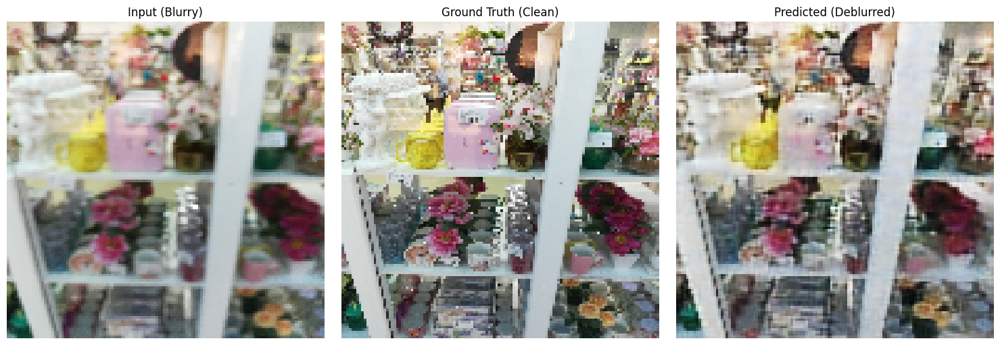

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


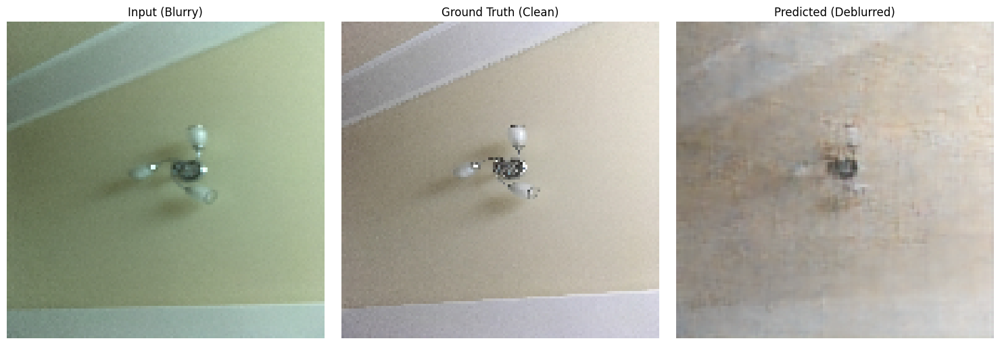

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


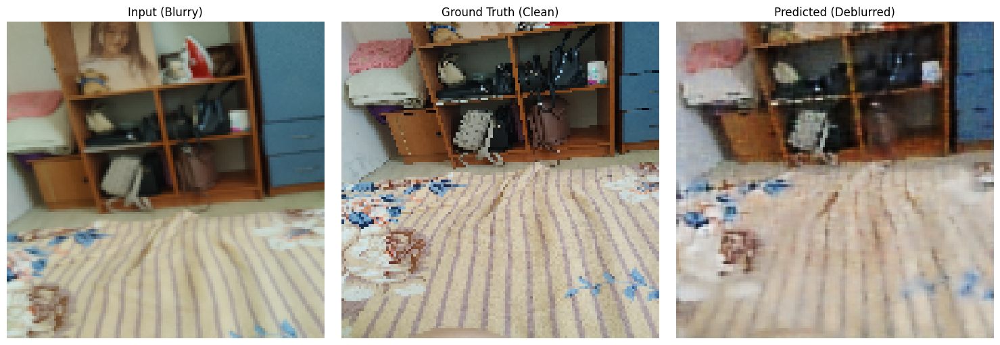

In [ ]:
for i in range(3):
    r = random.randint(0, len(clean_frames) - 1)

    x = blurry_frames[r]
    y = clean_frames[r]
    x_input = x.reshape(1, 128, 128, 3)

    result = autoencoder.predict(x_input)[0]

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    titles = ["Input (Blurry)", "Ground Truth (Clean)", "Predicted (Deblurred)"]
    images = [x, y, result]

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Graf gubitka

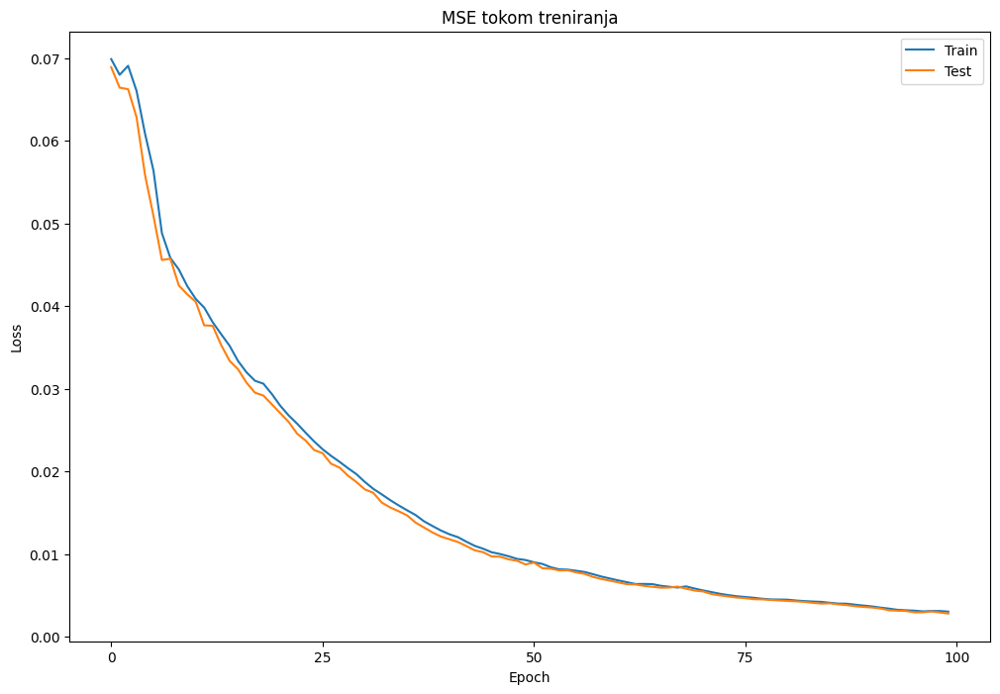

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train', 'Test'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(0, 101, 25))
plt.title('MSE tokom treniranja')
plt.show()

# Grafovi ostalih metrika


In [ ]:
denoised_frames = autoencoder.predict(blurry_frames)

9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step


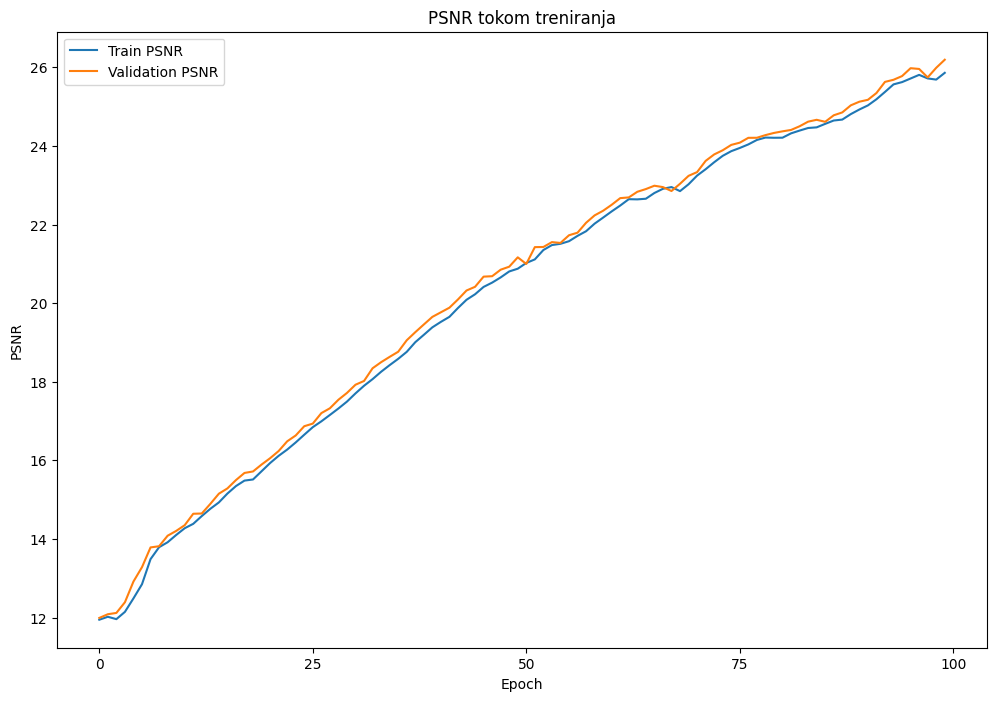

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(history.history['psnr_metric'])
plt.plot(history.history['val_psnr_metric'])
plt.legend(['Train PSNR', 'Validation PSNR'])
plt.xlabel('Epoch')
plt.ylabel('PSNR')
plt.xticks(np.arange(0, 101, 25))
plt.title('PSNR tokom treniranja')
plt.show()

In [ ]:
import tensorflow as tf
import numpy as np

psnr_before = tf.image.psnr(clean_frames, blurry_frames, max_val=1.0).numpy().mean()

psnr_after = tf.image.psnr(clean_frames, denoised_frames, max_val=1.0).numpy().mean()

psnr_improvement = ((psnr_after - psnr_before) / psnr_before) * 100

print(f"PSNR prije: {psnr_before:.2f}")
print(f"PSNR poslije: {psnr_after:.2f}")
print(f"Procentualno smanjenje šuma (PSNR): {psnr_improvement:.2f}%")


PSNR prije: 14.06
PSNR poslije: 26.19
Procentualno smanjenje šuma (PSNR): 86.30%


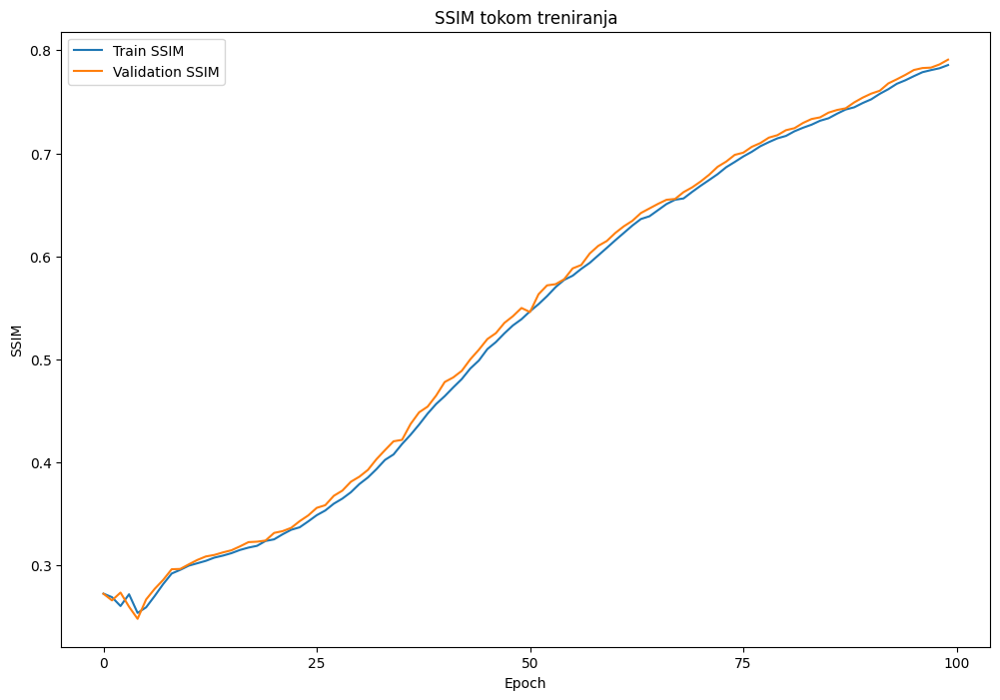

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(history.history['ssim_metric'])
plt.plot(history.history['val_ssim_metric'])
plt.legend(['Train SSIM', 'Validation SSIM'])
plt.xlabel('Epoch')
plt.ylabel('SSIM')
plt.xticks(np.arange(0, 101, 25))
plt.title('SSIM tokom treniranja')
plt.show()

In [ ]:
ssim_before = tf.image.ssim(clean_frames, blurry_frames, max_val=1.0).numpy().mean()

ssim_after = tf.image.ssim(clean_frames, denoised_frames, max_val=1.0).numpy().mean()

ssim_improvement = ((ssim_after - ssim_before) / ssim_before) * 100

print(f"SSIM prije: {ssim_before:.4f}")
print(f"SSIM poslije: {ssim_after:.4f}")
print(f"Procentualno smanjenje šuma (SSIM): {ssim_improvement:.2f}%")

SSIM prije: 0.2810
SSIM poslije: 0.7910
Procentualno smanjenje šuma (SSIM): 181.50%


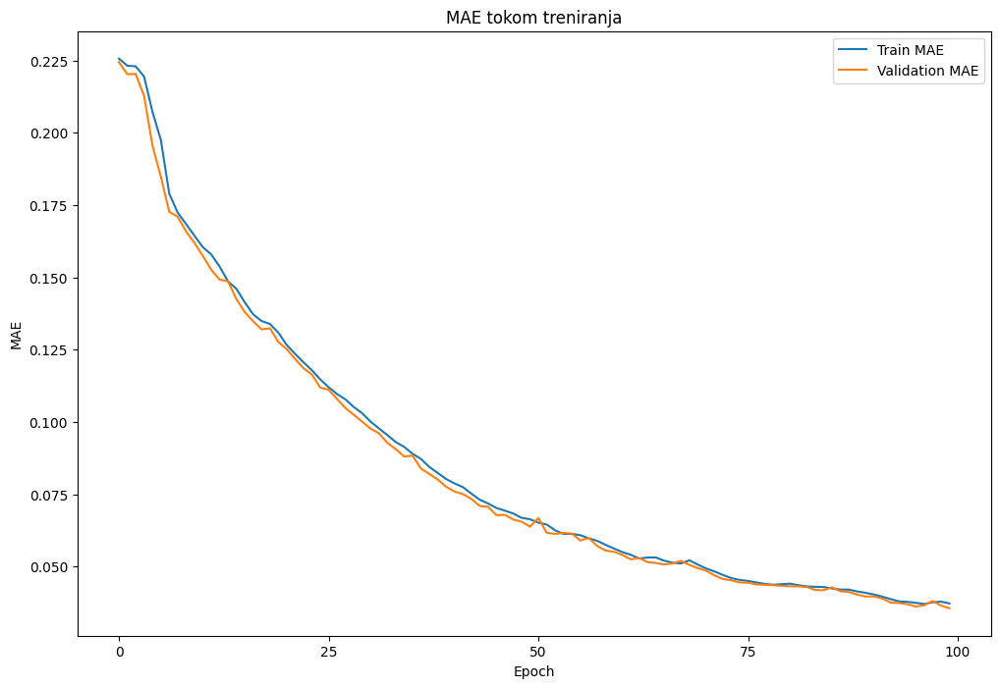

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(history.history['mean_absolute_error'], label='Train MAE')
plt.plot(history.history['val_mean_absolute_error'], label='Validation MAE')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('MAE')
plt.xticks(np.arange(0, 101, 25))
plt.title('MAE tokom treniranja')
plt.show()

In [ ]:
mae = MeanAbsoluteError()
mae_before = mae(clean_frames, blurry_frames).numpy()

mae_after = mae(clean_frames, denoised_frames).numpy()

mae_improvement = ((mae_before - mae_after) / mae_before) * 100

print(f"MAE prije: {mae_before:.6f}")
print(f"MAE poslije: {mae_after:.6f}")
print(f"Procentualno smanjenje greške (MAE): {mae_improvement:.2f}%")


MAE prije: 0.150438
MAE poslije: 0.093021
Procentualno smanjenje greške (MAE): 38.17%


# Vizualizacija rezultata modela

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


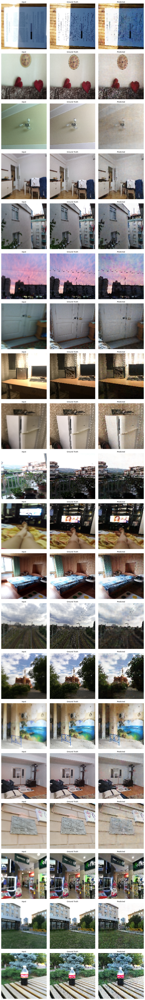

In [ ]:
fig, axes = plt.subplots(20, 3, figsize=(12, 80))

for i in range(20):
    x = blurry_frames[i]
    y = clean_frames[i]
    x_input = x.reshape(1, 128, 128, 3)

    result = autoencoder.predict(x_input)[0]

    images = [x, y, result]
    titles = ["Input", "Ground Truth", "Predicted"]

    for j in range(3):
        ax = axes[i, j]
        ax.imshow(images[j])
        ax.set_title(titles[j], fontsize=10)
        ax.axis('off')

plt.tight_layout()
plt.show()

# Čuvanje podataka

In [ ]:
autoencoder.save('autoencoder.h5')

In [ ]:
from google.colab import files
files.download("autoencoder.h5")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 104_IPHONE-SE_F.jpg to 104_IPHONE-SE_F.jpg


In [ ]:
from tensorflow.keras.models import load_model
model = load_model("autoencoder.h5", compile=False)
print("Model successfully loaded")

Model successfully loaded


# Prikaz rada aplikacije sa nepoznatim podacima

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


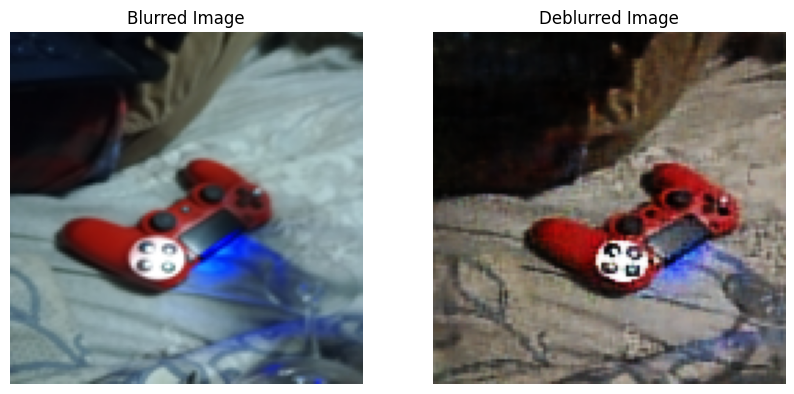

In [ ]:
import io
from PIL import Image

def preprocess_image(image_bytes):
    image = Image.open(io.BytesIO(image_bytes)).convert("RGB")
    image = image.resize((128, 128))
    image_array = np.array(image).astype("float32") / 255.0
    return np.expand_dims(image_array, axis=0)

def postprocess_image(output_array):
    output_array = np.clip(output_array[0], 0, 1)
    output_array = (output_array * 255).astype('uint8')
    image = Image.fromarray(output_array)
    return image

def deblur_image(image_bytes):
    input_array = preprocess_image(image_bytes)
    output_array = model.predict(input_array)
    return postprocess_image(output_array)

with open("/content/blur-dataset/blur_dataset_scaled/defocused_blurred/160_HUAWEI-P20-LITE_F.jpg", "rb") as f:
    image_bytes = f.read()

result_image = deblur_image(image_bytes)

original_image = Image.open(io.BytesIO(image_bytes)).resize((128,128))

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title("Blurred Image")
plt.axis('off')
plt.imshow(original_image)

plt.subplot(1,2,2)
plt.title("Deblurred Image")
plt.axis('off')
plt.imshow(result_image)

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


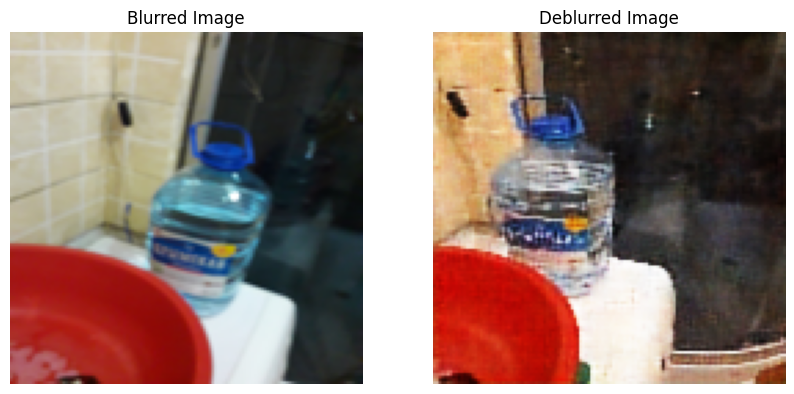

In [ ]:
with open("/content/blur-dataset/blur_dataset_scaled/defocused_blurred/165_SAMSUNG-GALAXY-J3_F.jpg", "rb") as f:
    image_bytes = f.read()

result_image = deblur_image(image_bytes)

original_image = Image.open(io.BytesIO(image_bytes)).resize((128,128))

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title("Blurred Image")
plt.axis('off')
plt.imshow(original_image)

plt.subplot(1,2,2)
plt.title("Deblurred Image")
plt.axis('off')
plt.imshow(result_image)

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


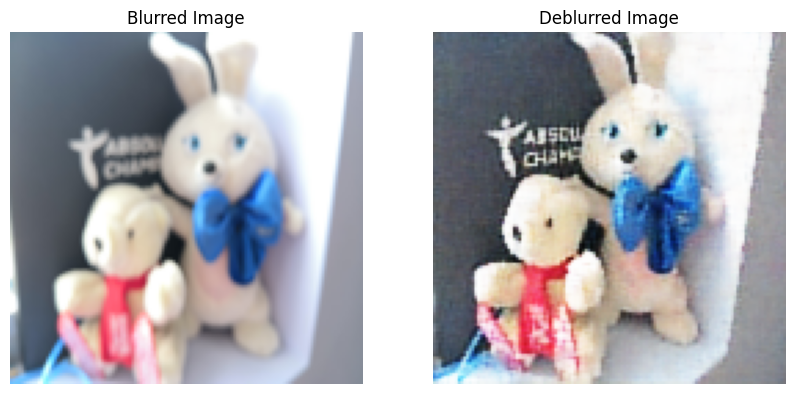

In [ ]:
with open("/content/blur-dataset/blur_dataset_scaled/defocused_blurred/181_HONOR-10_F.jpg", "rb") as f:
    image_bytes = f.read()

result_image = deblur_image(image_bytes)

original_image = Image.open(io.BytesIO(image_bytes)).resize((128,128))

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title("Blurred Image")
plt.axis('off')
plt.imshow(original_image)

plt.subplot(1,2,2)
plt.title("Deblurred Image")
plt.axis('off')
plt.imshow(result_image)

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


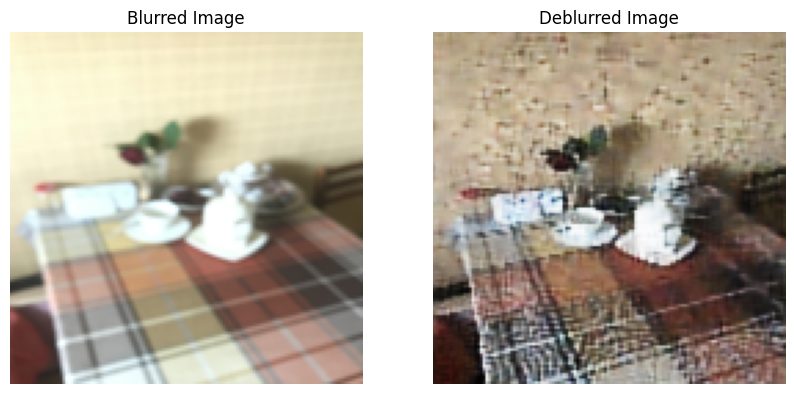

In [ ]:
with open("/content/blur-dataset/blur_dataset_scaled/defocused_blurred/193_IPHONE-7_F.jpeg", "rb") as f:
    image_bytes = f.read()

result_image = deblur_image(image_bytes)

original_image = Image.open(io.BytesIO(image_bytes)).resize((128,128))

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title("Blurred Image")
plt.axis('off')
plt.imshow(original_image)

plt.subplot(1,2,2)
plt.title("Deblurred Image")
plt.axis('off')
plt.imshow(result_image)

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


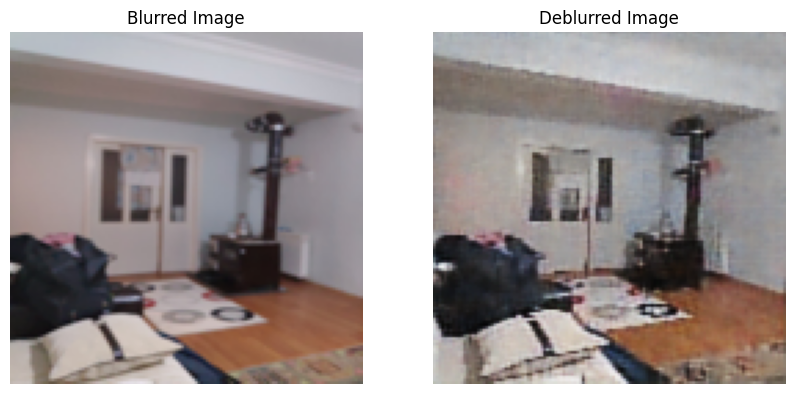

In [ ]:
with open("/content/blur-dataset/blur_dataset_scaled/defocused_blurred/11_XIAOMI-MI8-SE_F.jpg", "rb") as f:
    image_bytes = f.read()

result_image = deblur_image(image_bytes)

original_image = Image.open(io.BytesIO(image_bytes)).resize((128,128))

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title("Blurred Image")
plt.axis('off')
plt.imshow(original_image)

plt.subplot(1,2,2)
plt.title("Deblurred Image")
plt.axis('off')
plt.imshow(result_image)

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


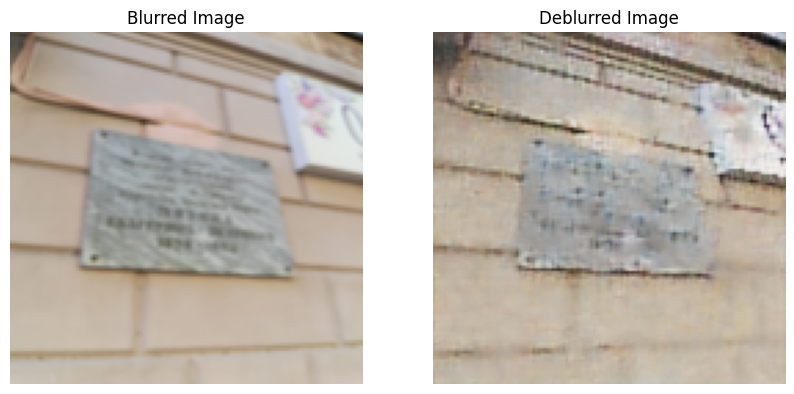

In [ ]:
with open("/content/blur-dataset/blur_dataset_scaled/defocused_blurred/120_HONOR-7X_F.jpg", "rb") as f:
    image_bytes = f.read()

result_image = deblur_image(image_bytes)

original_image = Image.open(io.BytesIO(image_bytes)).resize((128,128))

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title("Blurred Image")
plt.axis('off')
plt.imshow(original_image)

plt.subplot(1,2,2)
plt.title("Deblurred Image")
plt.axis('off')
plt.imshow(result_image)

plt.show()

# Backend server za aplikaciju

In [ ]:
from flask import Flask, request, jsonify, send_file
from flask_cors import CORS
from pyngrok import ngrok
import io
import json
from PIL import Image
import numpy as np
import tensorflow as tf

model = tf.keras.models.load_model("autoencoder.h5", compile=False)

def calculate_similarity_percent(img1, img2):
    img1 = np.array(img1).astype(np.float32)
    img2 = np.array(img2).astype(np.float32)
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100.0
    PIXEL_MAX = 255.0
    psnr = 20 * np.log10(PIXEL_MAX / np.sqrt(mse))
    # Normalizuj PSNR na skalu 0–100 (pretpostavi da je 50 dB ≈ 100%)
    percent = min(psnr / 50.0 * 100.0, 100.0)
    return round(percent, 2)

def deblur_image_array(image_bytes):
    image = Image.open(io.BytesIO(image_bytes)).convert("RGB")
    image = image.resize((128, 128))
    img_np = np.array(image) / 255.0
    img_np = np.expand_dims(img_np, axis=0)
    output = model.predict(img_np)[0]
    output = (output * 255).astype(np.uint8)
    return Image.fromarray(output)

app = Flask(__name__)
CORS(app)

@app.route("/deblur", methods=["POST"])
def deblur():
    if 'image' not in request.files:
        return jsonify({"error": "No image uploaded"}), 400

    file = request.files['image']
    image_bytes = file.read()

    try:
        input_image = Image.open(io.BytesIO(image_bytes)).convert("RGB").resize((128, 128))
        output_image = deblur_image_array(image_bytes)
    except Exception as e:
        print(f"[ERROR] Failed to process image: {e}")
        return jsonify({"error": "Invalid image format."}), 400

    img_io = io.BytesIO()
    output_image.save(img_io, 'PNG')
    img_io.seek(0)

    response = send_file(img_io, mimetype='image/png')
    similarity = calculate_similarity_percent(input_image, output_image)
    response.headers["X-Image-Similarity"] = str(similarity)

    return response

ngrok.set_auth_token("2ypzpRmnrtYX2S9Gu6gr1O89tbV_2J5dbZippfMNixdPBnEqG")
public_url = ngrok.connect(5000)
print("Public URL:", public_url)
app.run(port=5000)

Public URL: NgrokTunnel: "https://5244-34-82-188-10.ngrok-free.app" -> "http://localhost:5000"
 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


INFO:werkzeug:127.0.0.1 - - [29/Jun/2025 09:16:26] "POST /deblur HTTP/1.1" 200 -


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


INFO:werkzeug:127.0.0.1 - - [29/Jun/2025 09:23:25] "POST /deblur HTTP/1.1" 200 -


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


INFO:werkzeug:127.0.0.1 - - [29/Jun/2025 09:24:44] "POST /deblur HTTP/1.1" 200 -


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


INFO:werkzeug:127.0.0.1 - - [29/Jun/2025 09:27:11] "POST /deblur HTTP/1.1" 200 -


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


INFO:werkzeug:127.0.0.1 - - [29/Jun/2025 09:45:21] "POST /deblur HTTP/1.1" 200 -


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


INFO:werkzeug:127.0.0.1 - - [29/Jun/2025 10:01:58] "POST /deblur HTTP/1.1" 200 -


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


INFO:werkzeug:127.0.0.1 - - [29/Jun/2025 10:03:23] "POST /deblur HTTP/1.1" 200 -


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


INFO:werkzeug:127.0.0.1 - - [29/Jun/2025 10:11:26] "POST /deblur HTTP/1.1" 200 -


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


INFO:werkzeug:127.0.0.1 - - [29/Jun/2025 10:12:35] "POST /deblur HTTP/1.1" 200 -
